In [249]:
import numpy as np
import pandas as pd

from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display

from sklearn.tree import DecisionTreeClassifier


In [250]:
df = pd.read_csv("conversion_data_train.csv")
print("(columns, rows) of dataset:", df.shape)

(columns, rows) of dataset: (284580, 6)


In [251]:
df.head()


,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


In [252]:
# Checking missing values
def missing_values(df, norows):
    total = df.isnull().sum().sort_values(ascending=False)
    percent = (
        (df.isnull().sum().sort_values(ascending=False) / df.shape[0]) * 100
    ).sort_values(ascending=False)
    missing_data = pd.concat(
        [total, percent], axis=1, keys=["Total", "Percent_Missing"]
    )
    return missing_data.head(norows)


missing_values(df, 20)

,Total,Percent_Missing
country,0,0.0
age,0,0.0
new_user,0,0.0
source,0,0.0
total_pages_visited,0,0.0
converted,0,0.0


In [253]:
display(df.describe(include="all"))

,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000


In [254]:
# create boxplots of numerical features
fig = make_subplots(
    rows=2, cols=2, subplot_titles=("age", "total_pages_visited", "source")
)
fig.add_trace(go.Box(y=df["age"], name="age"), row=1, col=1)
fig.add_trace(
    go.Box(y=df["total_pages_visited"], name="total_pages_visited"), row=1, col=2
)
fig.add_trace(go.Box(y=df["source"], name="source"), row=2, col=2)
fig.update_layout(height=600, width=800, title_text="Boxplots of numerical features")

In [255]:
df = df.sample(10000).copy()


In [256]:
fig = px.histogram(df, x="country", color="converted", barmode="group")
fig.show()


In [257]:
# sns.displot(df['age'], kde=True, bins=10)

# create  a grid of displots for each feature except "converted"
# fig = make_subplots(rows=3, cols=3, subplot_titles=df.columns[:-1])

fig = make_subplots(rows=3, cols=3, subplot_titles=df.columns)
for i, col in enumerate(df.columns):
    fig.add_trace(
        go.Histogram(x=df[col], name=col),
        row=i // 3 + 1,
        col=i % 3 + 1,
        # add proportion for each bin
    )
fig.update_layout(height=1000, width=1000, title_text="Distribution of all features")
fig.show()

In [258]:
# make displots of features distribution
def plot_displots(df, features):
    for feature in features:
        fig = px.scatter(df, x=feature)
        fig.show()


plot_displots(df, df.columns)

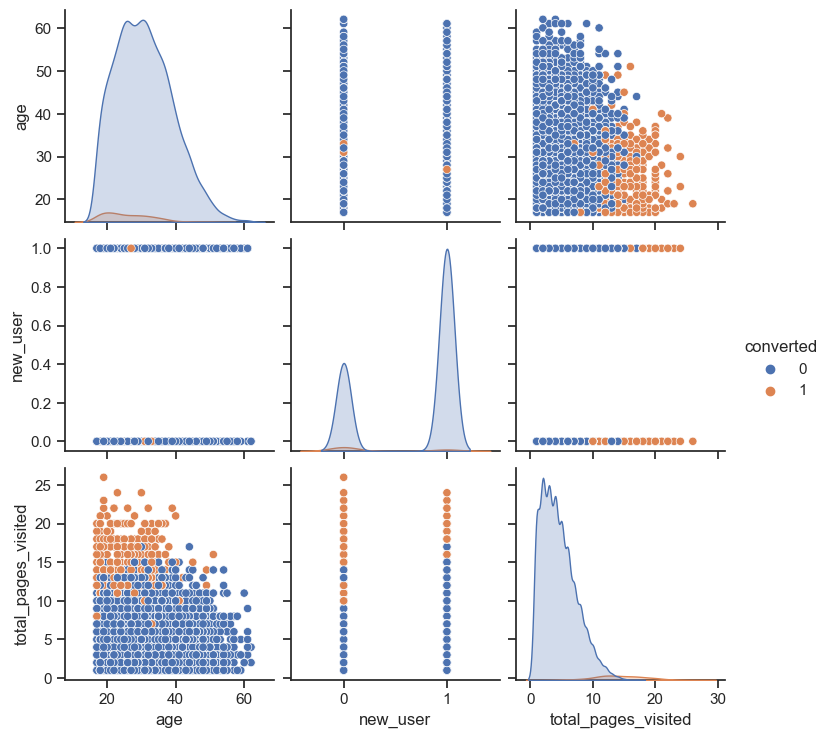

In [259]:
df = df.sample(10000).copy()

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="ticks", color_codes=True)
sns.pairplot(df, hue="converted")

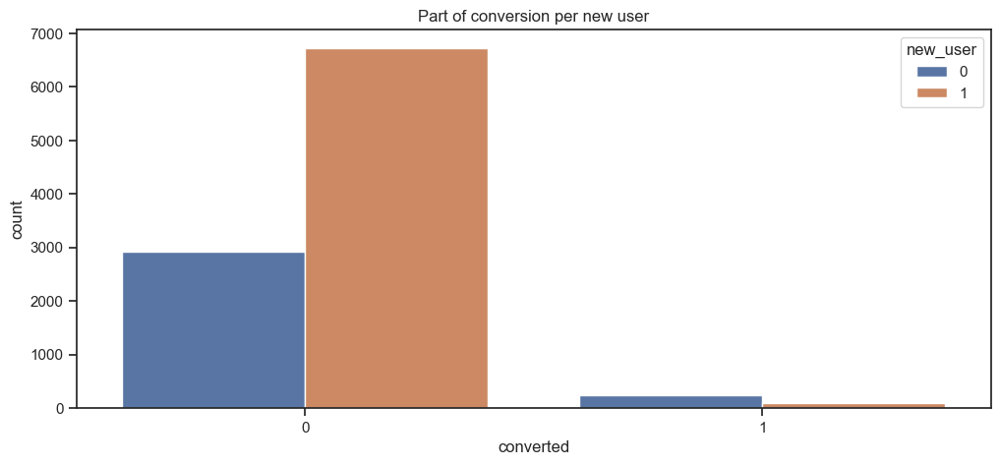

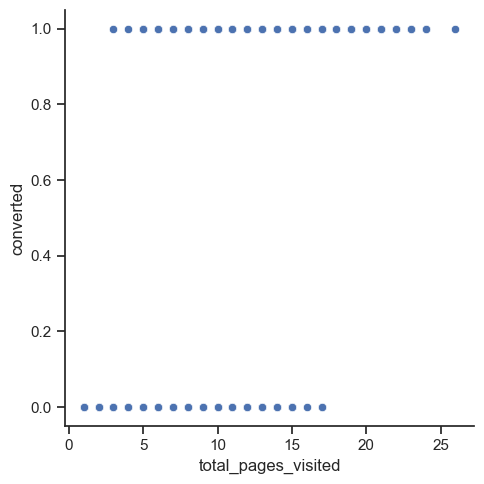

In [260]:
# repartition des conversion rate par new user:
plt.figure(figsize=[12, 5])
sns.countplot(x="converted", hue="new_user", data=df).set(
    title="Part of conversion per new user"
)


sns.relplot(data=df, x="total_pages_visited", y="converted")



In [261]:
# Univariate analysis


# Distribution of each numeric variable
num_features = ["age", "total_pages_visited"]
fig1 = make_subplots(rows=len(num_features), cols=1, subplot_titles=num_features)
for i in range(len(num_features)):
    fig1.add_trace(go.Histogram(x=df[num_features[i]], nbinsx=4), row=i + 1, col=1)
fig1.update_layout(
    title=go.layout.Title(text="Distribution of quantitative variables", x=0.5),
    showlegend=False,
    autosize=False,
    height=500,
)
fig1.show()



# Barplot of each qualitative variable

cat_features = ["country", "new_user", "source", "converted"]
fig2 = make_subplots(rows=len(cat_features), cols=1, subplot_titles=cat_features)
for i in range(len(cat_features)):
    x_coords = df[cat_features[i]].value_counts().index.tolist()
    y_coords = df[cat_features[i]].value_counts().tolist()

    fig2.add_trace(go.Bar(x=x_coords, y=y_coords), row=i + 1, col=1)
fig2.update_layout(
    title=go.layout.Title(text="Barplot of qualitative variables", x=0.5),
    showlegend=False,
    autosize=False,
    height=500,
)
fig2.show()

<Axes: xlabel='converted', ylabel='count'>

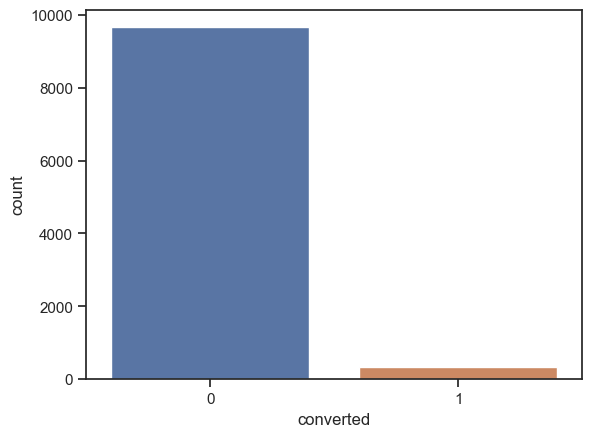

In [262]:
# Check the distribution of the target variable
sns.countplot(x="converted", data=df)

In [263]:
mask = df["age"] < 80
data = df[mask]

features_list = ["country", "age", "new_user", "source", "total_pages_visited"]
target_variable = "converted"

X = data.loc[:, features_list]
Y = data.loc[:, target_variable]

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, stratify=Y
)

numeric_features = ['age', 'total_pages_visited']
categorical_features = ['new_user', 'country', 'source']

numeric_transformer = Pipeline(steps=[
    ('imputer', KNNImputer()), 
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(
    steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), # missing values will be replaced by most frequent value
    ('encoder', OneHotEncoder(drop='first')) # first column will be dropped to avoid creating correlations between features
    ])

# Use ColumnTransformer to make a preprocessor object that describes all the treatments to be done
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

In [264]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

# Define features and target
features_list = ["country", "age", "new_user", "source", "total_pages_visited"]
target_variable = "converted"
X = data.loc[:, features_list]
Y = data.loc[:, target_variable]

# Split the dataset
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.1, random_state=0, stratify=Y
)

# Preprocessing
numeric_features = ["age", "total_pages_visited"]
categorical_features = ["country", "new_user", "source"]
numeric_transformer = Pipeline(steps=[("scaler", StandardScaler())])
categorical_transformer = Pipeline(steps=[("encoder", OneHotEncoder(drop="first"))])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Grid search
sgdc = SGDClassifier()

params = {
    'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'max_iter': [1000, 2000, 3000],
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive']
}


gridsearch_sgdc = GridSearchCV(sgdc, param_grid=params, cv=3, scoring="f1", verbose = 3)
gridsearch_sgdc.fit(X_train, Y_train)


Fitting 3 folds for each of 576 candidates, totalling 1728 fits
[CV 1/3] END alpha=0.0001, learning_rate=constant, loss=hinge, max_iter=1000, penalty=l1;, score=nan total time=   0.0s
[CV 2/3] END alpha=0.0001, learning_rate=constant, loss=hinge, max_iter=1000, penalty=l1;, score=nan total time=   0.0s
[CV 3/3] END alpha=0.0001, learning_rate=constant, loss=hinge, max_iter=1000, penalty=l1;, score=nan total time=   0.0s
[CV 1/3] END alpha=0.0001, learning_rate=constant, loss=hinge, max_iter=1000, penalty=l2;, score=nan total time=   0.0s
[CV 2/3] END alpha=0.0001, learning_rate=constant, loss=hinge, max_iter=1000, penalty=l2;, score=nan total time=   0.0s
[CV 3/3] END alpha=0.0001, learning_rate=constant, loss=hinge, max_iter=1000, penalty=l2;, score=nan total time=   0.0s
[CV 1/3] END alpha=0.0001, learning_rate=constant, loss=hinge, max_iter=1000, penalty=elasticnet;, score=nan total time=   0.0s
[CV 2/3] END alpha=0.0001, learning_rate=constant, loss=hinge, max_iter=1000, penalty=el

GridSearchCV(cv=3, estimator=SGDClassifier(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.1],
                         'learning_rate': ['constant', 'optimal', 'invscaling',
                                           'adaptive'],
                         'loss': ['hinge', 'log', 'modified_huber',
                                  'squared_hinge'],
                         'max_iter': [1000, 2000, 3000],
                         'penalty': ['l1', 'l2', 'elasticnet']},
             scoring='f1', verbose=3)

Accuracy on training set:  0.7598566308243728
Accuracy on test set:  0.7936507936507937
Best hyperparameters:  {'alpha': 0.0001, 'learning_rate': 'optimal', 'loss': 'hinge', 'max_iter': 2000, 'penalty': 'l2'}
Best validation accuracy:  0.7626498226215207
f1-score on train set:  0.7598566308243728
f1-score on test set:  0.7936507936507937
Cross-validated f1 score: 0.6443357348772057
Standard deviation: 0.13240629649478206
Classification report:
               precision    recall  f1-score   support

           0       0.99      1.00      0.99       966
           1       0.86      0.74      0.79        34

    accuracy                           0.99      1000
   macro avg       0.93      0.87      0.89      1000
weighted avg       0.99      0.99      0.99      1000



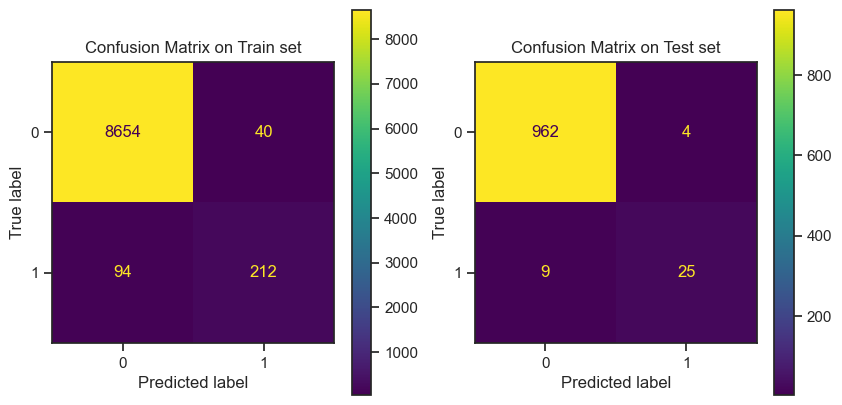

In [265]:
# Metrics
print("Accuracy on training set: ", gridsearch_sgdc.score(X_train, Y_train))
print("Accuracy on test set: ", gridsearch_sgdc.score(X_test, Y_test))

Y_train_pred = gridsearch_sgdc.predict(X_train)
Y_test_pred = gridsearch_sgdc.predict(X_test)

print("Best hyperparameters: ", gridsearch_sgdc.best_params_)
print("Best validation accuracy: ", gridsearch_sgdc.best_score_)

print("f1-score on train set: ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set: ", f1_score(Y_test, Y_test_pred))

cv_results = cross_val_score(
    gridsearch_sgdc.best_estimator_, X_train, Y_train, cv=5, scoring="f1"
)
print("Cross-validated f1 score:", cv_results.mean())
print("Standard deviation:", cv_results.std())

print("Classification report:\n", classification_report(Y_test, Y_test_pred))

_, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
axes[0].set(title="Confusion Matrix on Train set")
ConfusionMatrixDisplay.from_estimator(
    gridsearch_sgdc.best_estimator_, X_train, Y_train, ax=axes[0]
)

axes[1].set(title="Confusion Matrix on Test set")
ConfusionMatrixDisplay.from_estimator(
    gridsearch_sgdc.best_estimator_, X_test, Y_test, ax=axes[1]
)
plt.show()

# Train best classifier on all data and use it to make predictions on X_without_labels
**Before making predictions on the file conversion_data_test.csv, let's train our model on ALL the data that was in conversion_data_train.csv. Sometimes, this allows to make tiny improvements in the score because we're using more examples to train the model.**

In [266]:
# Concatenate our train and test set to train your best classifier on all data with labels
X = np.append(X_train, X_test, axis=0)
Y = np.append(Y_train, Y_test)

gridsearch_sgdc.best_estimator_.fit(X, Y)


SGDClassifier(max_iter=2000)

In [267]:
pred = gridsearch_sgdc.best_estimator_.predict(X)
print("f1-score on set : ", f1_score(Y, pred))


f1-score on set :  0.7605633802816902


In [268]:
# Read data without labels
data_without_labels = pd.read_csv("conversion_data_test.csv")
print("Prediction set (without labels) :", data_without_labels.shape)

# Warning : check consistency of features_list (must be the same than the features
# used by your best classifier)
features_list = ["country", "age", "new_user", "source", "total_pages_visited"]
X_without_labels = data_without_labels.loc[:, features_list]

Prediction set (without labels) : (31620, 5)


In [269]:
# WARNING : PUT HERE THE SAME PREPROCESSING AS FOR YOUR TEST SET
# CHECK YOU ARE USING X_without_labels
print("Encoding categorical features and standardizing numerical features...")

X_without_labels = preprocessor.transform(X_without_labels)
print("...Done")
print(X_without_labels[0:5, :])


Encoding categorical features and standardizing numerical features...
...Done
[[-0.31880849  3.33522421  0.          1.          0.          0.
   0.          1.        ]
 [-1.04557557  0.04178345  0.          1.          0.          1.
   1.          0.        ]
 [ 0.16570289 -1.15583137  0.          0.          0.          1.
   0.          1.        ]
 [ 0.16570289  0.34118716  0.          0.          1.          1.
   0.          0.        ]
 [-0.68219203 -0.55702396  0.          0.          0.          0.
   0.          1.        ]]


In [270]:
# Make predictions and dump to file
# WARNING : MAKE SURE THE FILE IS A CSV WITH ONE COLUMN NAMED 'converted' AND NO INDEX !
# WARNING : FILE NAME MUST HAVE FORMAT 'conversion_data_test_predictions_[name].csv'
# where [name] is the name of your team/model separated by a '-'
# For example : [name] = AURELIE-model1
import datetime

data = {"converted": gridsearch_sgdc.predict(X_without_labels)}

Y_predictions = pd.DataFrame(columns=["converted"], data=data)
Y_predictions.to_csv(
    f"conversion_data_test_predictions_LV-{datetime.datetime.now().timestamp()}.csv",
    index=False,
)